In [1]:
#### !/usr/local/bin/env python
from __future__ import division
import numpy as np
from numpy import array
from numpy.random import sample as rs
from numpy import newaxis as na
import pandas as pd 
from scipy.stats import distributions
from scipy.stats import sem
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
from radd.rl import multirace, analyzer, visr
from scipy.stats import pearsonr
from IPython.display import display, Latex

temporal_dynamics = lambda p, t: np.cosh(p['xb'][:, na] * t)
updateQ = lambda q, winner, r, A: q[winner][-1] + A*(r - q[winner][-1])
boltzmann_choiceP = lambda q, name, B: np.exp(B*q[name][-1])/np.sum([np.exp(B*q[k][-1]) for k in q.keys()])

homedir = os.path.expanduser('~')
cards = pd.read_csv(os.path.join(homedir, "Dropbox/Projects/IGTob/IGTCards.csv"))
cards_scaled=cards.copy()*.01
cards_normed = (cards-cards.mean().mean())/cards.std().mean()

datadf = pd.read_csv(os.path.join(homedir, "Dropbox/Projects/IGTob/IGT_data.csv"))
dat = datadf.dropna()


In [5]:
def simulate_race(p, pc_map={'vd': ['vd_a', 'vd_b', 'vd_c', 'vd_d'], 'vi': ['vi_a', 'vi_b', 'vi_c', 'vi_d']}, dt=.001, si=.01, tb=2.5):

    nresp = len(pc_map.values()[0])
    p = vectorize_params(p, pc_map=pc_map, nresp=nresp)
    dx=np.sqrt(si*dt)

    Pe = 0.5*(1 + (p['vd']-p['vi'])*dx/si)
    #Pd = 0.5*(1 + p['vd']*dx/si)
    #Pi = 0.5*(1 + p['vi']*dx/si)

    Tex = np.ceil((tb-p['tr'])/dt).astype(int)
    xtb = temporal_dynamics(p, np.cumsum([dt]*Tex.max()))
    execution = xtb[0] * np.cumsum(np.where((rs((nresp, Tex.max())).T < Pe),dx,-dx).T, axis=1)
    #direct = np.where((rs((nresp, Tex.max())).T < Pd),dx,-dx).T
    #indirect = np.where((rs((nresp, Tex.max())).T < Pi),dx,-dx).T
    #execution = xtb[0] * np.cumsum(direct-indirect, axis=1)

    return execution


In [6]:
dt=.001; si=.1; tb=.8; ntot=1000
dx=np.sqrt(si*dt)
p={'vd':.8, 'vi':.3, 'a':.4, 'tr':.2, 'xb':1.5}

p['a']=.4
p['tr']=.2
p['xb']=1.5

In [14]:
%%timeit

y=[range(200) for i in range(10)]
l=[]
for i in y:
    for yy in i:
        l.append(yy)

10000 loops, best of 3: 163 µs per loop


In [15]:
%%timeit
y=[range(200) for i in range(10)]

[[yy for yy in i] for i in y]

10000 loops, best of 3: 65.9 µs per loop


In [9]:
cards

,a,b,c,d
0,100,100,50,50
1,100,100,50,50
2,-150,100,-25,50
3,100,100,50,50
4,-300,100,-75,50
5,100,100,50,50
6,-200,100,-25,50
7,100,100,50,50
8,-250,-1250,-75,50
9,-350,100,-50,-250


In [7]:
p={'vd':.7, 'vi':.4}; p['a']=.4; p['tr']=.2; p['xb']=1.5

output = multirace.run_trials(p, cards, nblocks=2, si=.01, a_go=.2, a_no=.2, beta=1.5)

choices, rts, all_traces, qdict, choice_prob, vdhist, vihist = output

Pi,Qi = analyzer.igt_scores(np.asarray(choices))

In [8]:
visr.plot_traces_rts(p, all_traces, rts)

In [6]:
for name in np.sort(qdict_go.keys()):
    plt.plot(qdict[name], label=name)
    #plt.plot(qdict_no[name])

In [738]:
p['vd']=.5
p['vi']=.3
p['a']=.4

In [20]:
alphas_go = [.2]
alphas_no = [.2]
alphas = zip(alphas_go, alphas_no)

In [46]:
from random import random
from itertools import takewhile

def accumulate(iterator):
    """Returns a cumulative sum of the elements.
    accumulate([1, 2, 3, 4, 5]) --> 1 3 6 10 15"""
    current = 0
    for value in iterator:
        current += value
        yield current

def weightedChoice(weights, objects):
    """Return a random item from objects, with the weighting defined by weights 
    (which must sum to 1)."""
    limit = random()
    return objects[sum(takewhile(bool, (value < limit for value in accumulate(weights))))]

{'a': 0.3, 'tr': 0.22, 'vd': 0.5, 'vi': 0.3, 'xb': 1.5}

In [6]:
alpha_hi_dist = distributions.uniform(.16, .06)
alpha_midhi_dist = distributions.uniform(.1, .06)
alpha_mid_dist = distributions.uniform(.06, .06)
alpha_midlow_dist = distributions.uniform(.03, .06)
alpha_low_dist = distributions.uniform(.005, .03)

alpha_dist = {'ahi':alpha_hi_dist, 'amidhi':alpha_midhi_dist, 'amid':alpha_mid_dist, 'amidlow':alpha_midlow_dist, 'alow': alpha_low_dist}

In [2]:
p={'vd':.7, 'vi':.4}; p['a']=.4; p['tr']=.2; p['xb']=1.5

#alphas_go=np.array([.4, .25, .15, .05, .01])
alphas_go = np.linspace(.01, .4, 30)
alphas_no= np.ones_like(alphas_go)*.2 #np.array([.01, .05, .15, .25, .4]) #np.linspace(.5, 8, 10)
betas = np.array([5])#np.arange()

trialsdf, igtdf = multirace.run_full_sims(p, env=cards_scaled.copy(), alphas_go=alphas_go, alphas_no=alphas_no, betas=betas, nagents=120)

In [45]:
pvals = [grpdf.P.mean() for grp, grpdf in igtdf.groupby('bgroup')]
    

In [53]:
trialsdf.beta.unique()

array([ 0.5    ,  1.33333,  2.16667,  3.     ,  3.83333,  4.66667,
        5.5    ,  6.33333,  7.16667,  8.     ])

In [102]:
ax.get_xlim()

(0.0, 1.0)

In [19]:
clrs = sns.color_palette('deep', 5)

In [ ]:
for i in trialsdf.agroup.unique():
    trials = trialsdf[trialsdf.agroup==i]
    scores = igtdf[igtdf.agroup==i]
    trials.vdiff
    #reactivity = np.array([grpdf.vdiff.mean() for grp, grpdf in trials.groupby('bgroup')])
    #strategy = np.array([grpdf.v_opt_diff.mean() for grp, grpdf in trials.groupby('bgroup')])
    
    
    
    plt.plot(trials)

In [15]:
for i in trialsdf.agroup.unique():
    trials = trialsdf[trialsdf.agroup==i]
    #ago=trials.a_go.unique()
    #ano=trials.a_no.unique()
    #display(Latex("$$\\alpha^G = {0},{1}{1}\\alpha^N = {2}$$".format(ago[0], "...", ano[0])))
    scores = igtdf[igtdf.agroup==i]
    visr.plot_reactivity_strategy(trials, scores, pq='P')
    #plt.savefig('/home/kyle/Dropbox/apos%.2f_aneg%.2f_SENSITIVITY.png'%(ago,ano), dpi=300)
    #ax=plt.gca()

In [112]:
sns.palplot(blues)
sns.palplot(reds)

In [81]:
for i in trialsdf.agroup.unique():
    trials = trialsdf[trialsdf.agroup==i]
    ago=trials.a_go.unique()
    ano=trials.a_no.unique()
    scores = igtdf[igtdf.agroup==i]
    visr.plot_reactivity_payoff(trials, scores)
    plt.savefig('/home/kyle/Dropbox/apos%.2f_aneg%.2f.png'%(ago,ano), dpi=300)

In [5]:
tdf_mean = trialsdf.groupby(['group', 'trial']).mean().reset_index()
igt_mean = igtdf.groupby(['group']).mean().reset_index()

In [44]:
def plot_reactivity_strategy(trialsdf, igtdf, cm='rainbow', save=False, pq='P'):

    if pq=='P':
        measure = 'Payoff'
    else:
        measure = 'Sensitivity'

    n = trialsdf.agroup.unique().size
    a_go = trialsdf.a_go.unique()
    sm, vmin, vmax = visr.gen_mappable(vals_to_map=a_go, cm=cm)

    f, ax = plt.subplots(figsize=(7,6))
    

    for grp, grpdf in trialsdf.groupby('agroup'):
        colr = sm.to_rgba(a_go[int(grp)-1])
        ax.plot(grpdf.vdiff.values, color=colr)
        sns.despine()
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.2)
    cb = plt.colorbar(sm, cax)
    sm.colorbar.set_ticks([vmin, vmax])
    cax.set_yticklabels([vmin, vmax])
    
    ax.set_title('$\Delta_{card} = V_{D}(t)-V_{I}(t)$', fontsize=19)
    ax.set_ylabel('Selected Channel Strength ($\Delta_{card}$)', fontsize=17)
    ax.set_xlabel('Trials', fontsize=19)
    
    plt.tight_layout()
    
    if save:
        f.savefig('.'.join(['reactivity_strategy_%s' % measure, 'png']), dpi=1200)
        f.savefig('.'.join(['reactivity_strategy_%s' % measure, 'svg']), dpi=1200)
        f.savefig('.'.join(['reactivity_strategy_%s' % measure, 'eps']), dpi=1200)

In [26]:
os.chdir("/home/kyle/Dropbox/")

In [45]:
plot_reactivity_strategy(tdf_mean, igt_mean, save=True)

In [6]:
visr.plot_reactivity_strategy(tdf_mean, igt_mean)

In [79]:
for i in trialsdf.agroup.unique():
    trials = trialsdf[trialsdf.agroup==i]
    ago=trials.a_go.unique()
    ano=trials.a_no.unique()
    scores = igtdf[igtdf.agroup==i]
    visr.plot_reactivity_payoff(trials, scores)
    plt.savefig('/home/kyle/Dropbox/apos%.2f_aneg%.2f.png'%(ago,ano), dpi=300)

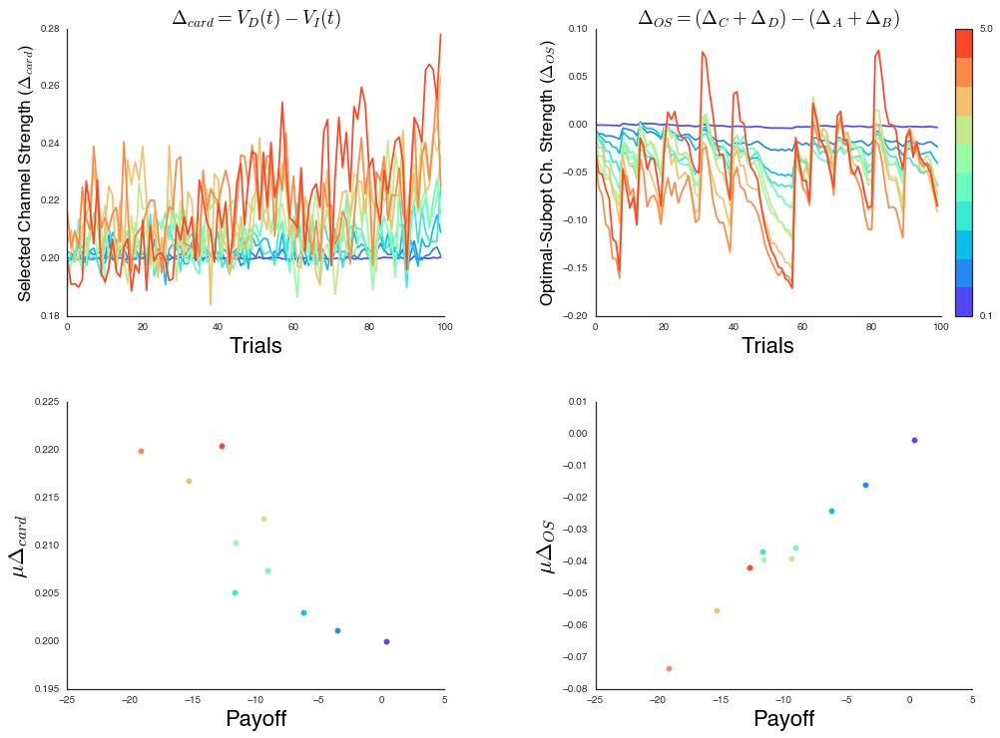

In [41]:
multirace.plot_reactivity_payoff(trialsdf[trialsdf.agroup==2], igtdf[igtdf.agroup==2])

In [725]:
clrs = sns.color_palette('Blues', trialsdf.bgroup.unique().size)
f, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 4))
#ax1, ax2, ax3, ax4 = axes.flatten()
for grp, grpdf in trialsdf.groupby('bgroup'):
    #ax1.set_title('Optimal Drift ($v_{go,opt}-v_{no-go,opt}$) - Suboptimal Drift ($v_{go,sub}-v_{no-go,sub}$)')
    ax1.plot(grpdf.v_opt_diff.values, color=clrs[int(grp)])
    ax2.plot(grpdf.vd.values-grpdf.vi.values, color=clrs[int(grp)])

#pvals_by_group = igtdf.groupby('bgroup').mean().loc[:, 'P'].values
#strategy = np.array([grpdf.v_opt_diff.values[-1] for grp, grpdf in trialsdf.groupby('bgroup')])
#pearsonr(pvals_by_group, strategy)
#sns.regplot(pvals_by_group, strategy, ax=ax3)
#pearsonr(pvals_by_group, strategy)

In [82]:
Pmu = df.pivot_table('P', index='Beta', aggfunc=np.mean).values
Pse = df.pivot_table('P', index='Beta', aggfunc=sem).values*2

Qmu = df.pivot_table('Q', index='Beta', aggfunc=np.mean).values
Qse = df.pivot_table('Q', index='Beta', aggfunc=sem).values*2

In [84]:
x = df.Beta.unique()
plt.errorbar(x=x, y=Pmu, yerr=Pse, label='P +/- 95CI')
plt.errorbar(x=x, y=Qmu, yerr=Qse, label='Q +/- 95CI')
ax = plt.gca()
ax.legend(loc=0)
sns.despine()

ax.set_xlabel('Exploitation Parameter (Softmax InvTemp)')
ax.set_ylabel('P,Q Score')
#plt.savefig('/home/kyle/Dropbox/PQ_PolicyEffect_95CI.png', dpi=300)

In [96]:
plt.hist(choices)
plot_qvals(qdict)
plot_prob(choicep)

In [1]:
niter=25
nblocks=5

si_range=np.linspace(.01,.5, niter)
b_range=np.linspace(1,20, niter)
#alpha_pos_range=np.linspace(.01, .2, n_params)
#alpha_neg_range=np.linspace(.02, .4, n_params)
cprobs=[]
dfP = pd.DataFrame(data=np.zeros([niter,niter]), index=si_range, columns=b_range)
dfQ = deepcopy(dfP)

#for row, si in enumerate(si_range):
for col, b in enumerate(b_range):

    p={'vd':.8, 'vi':.3}
    p['a']=.4
    p['tr']=.2
    p['xb']=1.5

    output = multirace.run_trials(p, cards_normed, nblocks=nblocks, si=.1, alpha_pos=.1, alpha_neg=.3, beta=b)
    choices, rts, all_traces, qdict, choicep = output
    P,Q=multirace.igt_scores(np.asarray(choices))
    cp = deepcopy(choicep)
    cprobs.append(cp)
    dfP.iloc[row, col] = P
    dfQ.iloc[row, col] = Q
        
    

NameError: name 'multirace' is not defined

In [114]:
updateQ = lambda q, winner, r, A: q[winner][-1] + A*(r - q[winner][-1])
boltzmann_choiceP = lambda q, name, B: np.exp(B*q[name][-1])/np.sum([np.exp(B*q[k][-1]) for k in q.keys()])

def analyze_multiresponse(execution, p, qdict={}, vals=[], names=[], alpha_pos=.06, alpha_neg=.06,  dt=.001, beta=5, choice_prob={}):
    """analyze multi-race execution processes"""

    nsteps_to_rt = np.argmax((execution.T>=p['a']).T, axis=1)
    rts = p['tr'] + nsteps_to_rt*dt

    # set non responses to 999
    rts[rts==p['tr'][0]]=999
    if np.all(rts==999):
        # if no response occurs, increase exponential bias
        #p['xb']=p['xb']*1.01
        #p['a']=p['a']*.99
        return np.nan, rts, execution, p, qdict, choice_prob

    # get accumulator with fastest RT (winner) in each cond
    winner = np.argmin(rts)

    # get rt of winner in each cond
    winrt = rts[winner]
    
    # slice all traces at time the winner crossed boundary
    traces = [execution[i, :nsteps_to_rt[winner]] for i in xrange(len(rts))]

    reward = vals[winner]
    winner_name = names[winner]
    loser_names = names[names!=winner_name]
    #qval = qdict[names[winner]][-1]
    # check valence of RPE
    
    if reward>=qdict[winner_name][-1]:
        rpe=1
        alpha=alpha_pos
    else:
        rpe=-1
        alpha=alpha_neg
        
    Qt = updateQ(qdict, winner_name, reward, alpha)
    
    qdict[winner_name].append(Qt)
    choice_prob[winner_name].append(boltzmann_choiceP(qdict, winner_name, beta))
    
    for lname in loser_names:
        choice_prob[lname].append(boltzmann_choiceP(qdict, lname, beta))
        
    # update action value
    # q_update = qval + alpha * (reward - qval)
    # qdict[names[winner]].append(q_update)
    # update direct & indirect drift-rates
    p = reweight_drift(p, winner, reward, alpha, rpe, choice_prob[winner_name])

    return winner, rts, traces, p, qdict, choice_prob


def reweight_drift(p, winner, reward, alpha, rpe, cp):
    """ update direct & indirect drift-rates for multirace winner """

    d0 = p['vd'][winner]
    i0 = p['vi'][winner]
    delta_cp = abs(cp[-1] - cp[-2])
    if rpe>0:
        # update direct drift-rate for choice(t)
        p['vd'][winner] = p['vd'][winner]+(alpha*delta_cp) #d0 + (reward-d0)*alpha
    else:
        # update indirect drift-rate for choice(t)
        p['vi'][winner] = p['vi'][winner]+(alpha*delta_cp) #*(1+alpha) #i0 + (abs(reward)-i0)*alpha
    return p

In [115]:
def run_trials(p, cards, nblocks=1, si=.1, alpha_pos=.06, alpha_neg=.06, beta=5):
    """simulate series of trials with learning
    Arguments:
        p (dict): parameter dictionary
        cards (DataFrame): pandas DF (ntrials x nalt) with choice outcome vaulues
    Returns:
        choices (list): choice made on each trial
        rts (dict): rt for each trial (winner rt)
        all_traces (list): execution process traces truncated to length of winner
        qdict (dict): sequence of Q-value updates for each alt
    """

    trials_n = np.asarray([cards.index]*nblocks).flatten()
    choices, all_traces = [], []
    names = cards.columns.values
    rts={k:[] for k in names}
    qdict={k:[0] for k in names}
    choice_prob={k:[.25] for k in names}

    for i in trials_n:
        vals = cards.iloc[i, :].values
        winner=np.nan
        while np.isnan(winner):
            execution = multirace.simulate_race(p, si=si)
            winner, rt, traces, p, qdict, choice_prob = analyze_multiresponse(execution, p, qdict=qdict, vals=vals, names=names, alpha_pos=alpha_pos, alpha_neg=alpha_neg, beta=beta, choice_prob=choice_prob)
        choice_name = names[winner]
        choices.append(winner); rts[choice_name].append(rt[winner]); all_traces.append(traces);
    return choices, rts, all_traces, qdict, choice_prob